# Location Analysis for Positioning Medical Centre in Greater London Area 

## 1. Introduction

In the real estate market, whether it be for purchasing a home or investment property, it’s all about location, location and location. There is no difference in the logic when it comes to starting a medical practice (or any other business venture for that matter), finding best suitable place would be the key for success. In this study, we will look at few characteristics of wards in Greater London area to determine the best wards for starting a new medical centre. 

In order to identify potential locations for a medical centre, we will collect few important statistics on each ward in Greater London area. Two main parameters to look at would be concentration of the population that we are trying to target and competition, meaning what other medical practices already exist in the area. There could be few secondary factors, which might be of importance, such as rate of population growth, young (0 – 15 year) or elderly (65+ year) population percentage, median household income, etc. For instance, if we intent to start a practice with paediatric-related services, it would be wise to focus on communities where parents with young children are moving.

 Findings from this study can be used for zeroing on neighbourhoods for the business purposes from the providers’ perspective, however, there are could be other use-cases as well. For instance, as a patient or a member of general public, one could be interest in localities those having better medical coverage in terms of availability of number medical practices within reasonable distance. Especially, with the current pandemic situation of COVID-19, living in such a local area where you have sufficient services available for medical care would be something that one might be particularly interested in. It is my view that, findings from this study can be equally applicable in those scenarios and provide valuable insights to desired parties to make an educated decision. 


## 2. Module Imports

In [62]:
import pandas as pd
import numpy as np

import geopandas as gpd

from geopy.geocoders import Nominatim
import geocoder

import requests
import folium
from folium import plugins

from sklearn.cluster import KMeans

import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib.cm as cm
import matplotlib.colors as colors

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN

from scipy.stats import pearsonr

## 3. Constants & Credentials

In [2]:
# Let's define CONSTANTS and USER CREDENTIALS. 

CLIENT_ID = 'KKZFGCTCC02KGF34FI4J0DSSRVPVD4E00NPT1TD0TBFVG3U2'
CLIENT_SECRET = 'BRD1XESDGD3CWYMELNBEIJCFW2MRONZXDZKOLMJPPU4EMETS'
VERSION = '20200405'

## 4. Data Requirements  

For this study, we analyse 624 wards in Greater London area. One of the best portal for free and open data relating to the capital city is the London Datastore (https://data.london.gov.uk/). Site has over 700 datasets to assist various users for range of applications purposes. 

As mentioned earlier, in this study, we will look at number of parameters for each ward in Greater London. We assume these parameters would assist in clustering the wards in such a way that it would ultimately help us in picking up few suitable suburbs, from the list of 600+ wards, for the purpose of initiating a medical practice. 

Specific parameters that we use for this analysis is given below with brief explanation for such consideration and the source of those data.

<b>1. Population Density</b>

With the increased number of people in the neighbourhood, proportionately, there would be more people, who may require medical assistance. Further to that, with the increased population in an area, there is also an elevated likelihood in community transmitted diseases, which is very much proved to be valid with the current COVID-19 situation in the world. 

* Source: Ward profiles and atlas in London Datastore provide a range of demographic and related data for each ward in Grater London (https://data.london.gov.uk/dataset/ward-profiles-and-atlas). We use <i>Population – 2015</i> and <i>Area – Square Kilometres</i> columns to extract the population density.


<b>2. Population Growth Coefficient</b>

Certain wards have higher population growth rate depending on the underlying situations in those areas. For instance, newly developed neighbourhood with significant proportion of young families would have higher growth rate compared to established neighbourhood. So, even though the current population density may not be higher, there is an increased tendency that the area would become dense in reasonable future, which might work preferably for the business purposes. 

* Source: Land area and population density figures for wards and boroughs are available in London Datastore for 2001 - 2050 (https://data.london.gov.uk/dataset/land-area-and-population-density-ward-and-borough). Growth coefficient will be calculated from 2011-2020 population data, where 2011 figures are from census data. In here, we use <i>sklearn library – Linear Regression model</i> to calculate the growth coefficient from 2010-2020 population data. 

<b>3. Percentage of 65+ years in the Population</b>

It is part of life that when we grow old, we find problems in our health and need medical assistance more frequently than the young adults. So, it is safe to assume that if the locality has higher percentage of elderly people, then there could be more people, who would be seeking medical care in that neighbourhood.

* Source: Ward profiles and atlas in London Datastore provide a range of demographic and related data for each ward in Grater London (https://data.london.gov.uk/dataset/ward-profiles-and-atlas). We use the column named; <i>Older people aged 65+ - 2015</i> for our analysis.

<b>4. Percentage of 0-15 years in the Population</b>

Similar to elderly population, young kids equally need medical care in their early life. As such, if a neighbourhood has comparably higher percentage of kids, it might be better suited for starting a medical practice. 

* Source: Ward profiles and atlas in London Datastore provide a range of demographic and related data for each ward in Grater London (https://data.london.gov.uk/dataset/ward-profiles-and-atlas). We use the column named; <i>Children aged 0-15 - 2015</i> for our analysis.

<b>5. Existing medical centre count</b>

Competition is a critical factor to consider about when starting any business. So, if a given ward already has significant number of established medical centres compared to population density, it might not be a better locality to consider.

* Source: This is where we use Foursquare API to fetch details about medical practices. API support number of category identifiers (https://developer.foursquare.com/docs/build-with-foursquare/categories), which would assist in getting suitable venues for the query. 


## 5. Data Aquisition & Manipulation

In this section, we import necessary datasets from aforementioned sources to our notebook. We will explore content of each dataset and manipulate by adding, dropping, modifying and merging those datasets. Our final goal of this section is to generate a one single dataframe, let's call it <i>london_df</i>, with all the required features/parameters that we discussed above.

### 5.1 Import First Dataset (Ward Profile Data from London Datastore)

In [41]:
# Let's import the first datasets from London Datastore. 

# Last row of the Excel file has brief description about the source and other details about the data.
# As it is not relavant to the dataset we want, we skip those by skipfooter = 1. 
london_df = pd.read_excel(io = 'ward-profiles-excel-version.xls', sheet_name='Data', skipfooter=1)
print('Imported ward profiles into a dataframe.')

Imported ward profiles into a dataframe.


In [42]:
london_df.tail(50)

,Ward name,Old code,New code,Population - 2015,Children aged 0-15 - 2015,Working-age (16-64) - 2015,Older people aged 65+ - 2015,% All Children aged 0-15 - 2015,% All Working-age (16-64) - 2015,% All Older people aged 65+ - 2015,...,A-Level Average Point Score Per Student - 2013/14,A-Level Average Point Score Per Entry; 2013/14,Crime rate - 2014/15,Violence against the person rate - 2014/15,"Deliberate Fires per 1,000 population - 2014",% area that is open space - 2014,Cars per household - 2011,Average Public Transport Accessibility score - 2014,% travel by bicycle to work - 2011,Turnout at Mayoral election - 2012
610,Westminster - Harrow Road,00BKGF,E05000635,12350,2350,8950,1050,18.859969,72.634396,8.505635,...,645.185600,205.026400,67.069684,23.724696,NaN,3.013115,0.408832,5.716771,6.595745,33.908288
611,Westminster - Hyde Park,00BKGG,E05000636,13450,1750,10400,1300,13.099398,77.154115,9.746487,...,736.140000,229.672000,152.609827,31.078067,0.079981,8.910986,0.458459,7.982478,4.606099,29.130850
612,Westminster - Knightsbridge and Belgravia,00BKGH,E05000637,10050,1050,7650,1400,10.352379,75.940673,13.706948,...,678.750000,216.900000,177.083333,21.990050,0.206356,69.111554,0.857548,6.629949,2.898209,28.088555
613,Westminster - Lancaster Gate,00BKGJ,E05000638,13800,1600,11050,1150,11.516162,80.047833,8.436005,...,791.869565,232.591304,150.426847,21.956522,0.149678,8.555573,0.366917,7.652653,6.005732,27.410677
614,Westminster - Little Venice,00BKGK,E05000639,11050,2000,7900,1200,18.197417,71.146031,10.656552,...,711.975806,207.901613,74.823054,17.285068,0.000000,15.447444,0.559782,5.644337,4.584838,35.670882
615,Westminster - Maida Vale,00BKGL,E05000640,10550,1900,7700,1000,17.850379,72.907197,9.242424,...,750.702857,225.777143,59.010091,17.251185,0.000000,27.243807,0.519420,5.186926,5.308092,33.844924
616,Westminster - Marylebone High Street,00BKGM,E05000641,11150,1050,8850,1250,9.325076,79.339436,11.335487,...,871.400000,232.920000,302.439024,32.017937,0.180489,6.112985,0.453368,7.741555,4.396496,32.952183
617,Westminster - Queen's Park,00BKGN,E05000642,13050,2650,9150,1300,20.174566,69.887451,9.937983,...,674.922500,209.425000,62.189055,24.827586,0.151976,4.423031,0.429739,5.040481,6.084453,35.906224
618,Westminster - Regent's Park,00BKGP,E05000643,12500,1950,8550,2000,15.682200,68.347854,15.969946,...,758.076316,212.692105,66.553453,14.720000,0.081539,62.225603,0.559142,5.223717,3.532458,31.412639
619,Westminster - St. James's,00BKGQ,E05000644,12050,1100,9650,1350,8.954481,79.819252,11.226266,...,598.940625,199.221875,990.004308,193.692946,0.555042,30.712215,0.420176,7.596735,3.598299,31.473354


In [43]:
# Let's now look at what are the columns in this dataframe.

for column in london_df.columns:
    print(column)
#print(london_df.columns)

# Well, there are quite a lot of columns in this dataset. But, we don't need most of these columns for our analysis. 
# So, we will pick up only the ones we want. 

extracted_columns = ['Ward name',
                     'New code',
                     'Population - 2015',
                     '% All Children aged 0-15 - 2015',
                     '% All Older people aged 65+ - 2015',            
                     'Area - Square Kilometres']

# Further to that, looking at Excel version of this dataset, we can see that there are few rows those having Borough names 
# instead of wards. 
# So, when you check the Ward name column, it is clear that wards are in the index range from 0 to 624.
london_df = london_df.loc[0:624, extracted_columns].reset_index(drop=True)

print('Modified London DataFrame has {} rows and {} columns.'.format(london_df.shape[0], london_df.shape[1]))

london_df.tail()

Ward name
Old code
New code
Population - 2015
Children aged 0-15 - 2015
Working-age (16-64) - 2015
Older people aged 65+ - 2015
% All Children aged 0-15 - 2015
% All Working-age (16-64) - 2015
% All Older people aged 65+ - 2015
Mean Age - 2013
Median Age - 2013
Area - Square Kilometres
Population density (persons per sq km) - 2013
% BAME - 2011
% Not Born in UK - 2011
% English is First Language of no one in household - 2011
General Fertility Rate - 2013
Male life expectancy -2009-13
Female life expectancy -2009-13 
% children in reception year who are obese - 2011/12 to 2013/14
% children in year 6 who are obese- 2011/12 to 2013/14
Rate of All Ambulance Incidents per 1,000 population - 2014
Rates of ambulance call outs for alcohol related illness - 2014
Number Killed or Seriously Injured on the roads - 2014
In employment (16-64) - 2011
Employment rate (16-64) - 2011
Number of jobs in area - 2013
Employment per head of resident WA population - 2013
Rate of new registrations of migrant 

,Ward name,New code,Population - 2015,% All Children aged 0-15 - 2015,% All Older people aged 65+ - 2015,Area - Square Kilometres
620,Westminster - Tachbrook,E05000645,8500,10.283897,14.936977,0.4
621,Westminster - Vincent Square,E05000646,10500,14.224548,12.635585,0.7
622,Westminster - Warwick,E05000647,9800,10.903903,12.136961,0.6
623,Westminster - Westbourne,E05000648,13200,20.798971,9.041386,0.7
624,Westminster - West End,E05000649,11250,8.663521,11.557297,2.0


In [44]:
# As seen from the Ward name column, it has both Borough and ward seperated by '-'. We will split this column to two seperate 
# columns in the dataframe. 
london_df[['Borough name', 'Ward']] = london_df['Ward name'].str.split('-', expand= True).iloc[:, 0:2]
london_df.drop(['Ward name'], axis = 1, inplace=True)

london_df.head()

,New code,Population - 2015,% All Children aged 0-15 - 2015,% All Older people aged 65+ - 2015,Area - Square Kilometres,Borough name,Ward
0,E09000001,8100,7.962057,15.151157,3.15148,City of London,None
1,E05000026,14750,25.958342,5.027478,1.30000,Barking and Dagenham,Abbey
2,E05000027,10600,25.701332,10.021725,1.40000,Barking and Dagenham,Alibon
3,E05000028,12700,25.370429,8.716898,1.30000,Barking and Dagenham,Becontree
4,E05000029,10400,24.326923,14.173077,3.40000,Barking and Dagenham,Chadwell Heath


In [45]:
# Now, if you look at the Borough name column in the dataframe above, there are some boroughs with two names, 
# combined with 'and'. 
# This pose issues when we try to fetch co-ordinates. So, we will split this column again. 
london_df['Borough'] = london_df['Borough name'].str.split(' and ', expand=True)[0]
london_df.drop(['Borough name'], axis = 1, inplace=True)

london_df.head()


,New code,Population - 2015,% All Children aged 0-15 - 2015,% All Older people aged 65+ - 2015,Area - Square Kilometres,Ward,Borough
0,E09000001,8100,7.962057,15.151157,3.15148,None,City of London
1,E05000026,14750,25.958342,5.027478,1.30000,Abbey,Barking
2,E05000027,10600,25.701332,10.021725,1.40000,Alibon,Barking
3,E05000028,12700,25.370429,8.716898,1.30000,Becontree,Barking
4,E05000029,10400,24.326923,14.173077,3.40000,Chadwell Heath,Barking


Now, if we look at the record at index = 0, it is for City of London, which is a borough. In actual fact, it has 25 small local wards. However, our dataset in London Datastore does not contain details of each of those 25 individual wards, which is the reason we having ward name as 'none' in our dataset. So, we will consider ward name as 'City of London'.

In [46]:
# So, let's replace the missing ward as City of London and Borough as London. It will then be able to fetch co-ordinates 
# through Nominatim. 

london_df.loc[0, 'Ward'] = 'City of London'
london_df.loc[0, 'Borough'] = 'London'

In [48]:
# Basically, we extract few columns from this dataset. But, as mentiond under Section 4.0, we are interested in Population 
# density. So, we add a new column to existing dataframe with population density.
london_df['Population Density'] = london_df['Population - 2015']/london_df['Area - Square Kilometres']

print('Modified London DataFrame has {} rows and {} columns.'.format(london_df.shape[0], london_df.shape[1]))
london_df.head()

Modified London DataFrame has 625 rows and 8 columns.


,New code,Population - 2015,% All Children aged 0-15 - 2015,% All Older people aged 65+ - 2015,Area - Square Kilometres,Ward,Borough,Population Density
0,E09000001,8100,7.962057,15.151157,3.15148,City of London,London,2570.220976
1,E05000026,14750,25.958342,5.027478,1.30000,Abbey,Barking,11346.153846
2,E05000027,10600,25.701332,10.021725,1.40000,Alibon,Barking,7571.428571
3,E05000028,12700,25.370429,8.716898,1.30000,Becontree,Barking,9769.230769
4,E05000029,10400,24.326923,14.173077,3.40000,Chadwell Heath,Barking,3058.823529


In [49]:
# Let's add co-ordinates for each ward in London
lat = []
lng = []

geocoder = Nominatim(user_agent='my-encoder')

for ward, borough in zip(london_df['Ward'], london_df['Borough']):
    try:
        latlng = geocoder.geocode('{}, {}, London'.format(ward, borough))
        lat.append(latlng.latitude)
        lng.append(latlng.longitude)
    except:
        lat.append(None)
        lng.append(None)
    
# Let's add these latitude and longitude values to our dataframe
london_df.insert(0, column = 'Latitude', value = lat)
london_df.insert(0, column = 'Longitude', value = lng)

london_df.head()

,Longitude,Latitude,New code,Population - 2015,% All Children aged 0-15 - 2015,% All Older people aged 65+ - 2015,Area - Square Kilometres,Ward,Borough,Population Density
0,-0.091998,51.515618,E09000001,8100,7.962057,15.151157,3.15148,City of London,London,2570.220976
1,0.075530,51.535688,E05000026,14750,25.958342,5.027478,1.30000,Abbey,Barking,11346.153846
2,0.153244,51.548280,E05000027,10600,25.701332,10.021725,1.40000,Alibon,Barking,7571.428571
3,0.126524,51.540311,E05000028,12700,25.370429,8.716898,1.30000,Becontree,Barking,9769.230769
4,0.127994,51.567986,E05000029,10400,24.326923,14.173077,3.40000,Chadwell Heath,Barking,3058.823529


In [174]:
#london_df.drop('Latitude', axis =1 , inplace=True)
#london_df.drop('Longitude', axis =1 , inplace=True)

In [52]:
# One important thing to look at in our current dataset is null/none values. Remember, in our latitude/longitude fetching
# part, we tried getting the co-ordinates using Nominatim, but if it is unable to fetch any co-ordinate data (which will 
# then raise an exception, resulting the code block to execute the except block of codes), it will just append the 
# co-ordinates as None. 

# When we using Foursquare API to get venue detail for medical centres, it is useless to pass any data with None co-ordinates. 
# Let's first find how many None records that we have in our current dataset.

null_df = pd.isnull(london_df)
print(null_df.sum(axis = 0))

print('\n\nFor following Boroughs and wards, Nominatim was unable to find the co-ordinates:')
london_df[null_df['Latitude']][['Borough','Ward']]

Longitude                             32
Latitude                              32
New code                               0
Population - 2015                      0
% All Children aged 0-15 - 2015        0
% All Older people aged 65+ - 2015     0
Area - Square Kilometres               0
Ward                                   0
Borough                                0
Population Density                     0
dtype: int64


For following Boroughs and wards, Nominatim was unable to find the co-ordinates:


,Borough,Ward
47,Bexley,Cray Meadows
51,Bexley,Falconwood and Welling
54,Bexley,North End
83,Bromley,Bromley Common and Keston
93,Bromley,Farnborough and Crofton
95,Bromley,Kelsey and Eden Park
96,Bromley,Mottingham and Chislehurst North
98,Bromley,Penge and Cator
105,Camden,Camden Town with Primrose Hill
108,Camden,Frognal and Fitzjohns


In [53]:
# We will save these 32 local wards/boroughs for which Nominatim couldn't find the co-ordinates. We will find the 
# co-ordinates manually using Google Maps data.

missing_coords_df = london_df[null_df['Latitude']][['Borough','Ward']]
missing_coords_df.to_csv('Missing.csv',index_label = 'Index')

In [54]:
# I have manually extracted co-ordinates for these 32 wards and saved them to a separate file, 'Found_Coords.csv'.
# Let's import them back and merge with london_df.

found_coords_df = pd.read_csv('Found_Coords.csv')
found_coords_df.head()

found_coords_df.set_index(['Index'], drop=True, inplace = True)

found_coords_df[['Latitude', 'Longitude']] = found_coords_df['Coordinates'].str.split(',', expand=True)
found_coords_df[['Latitude', 'Longitude']] = found_coords_df[['Latitude', 'Longitude']].astype('float64')

found_coords_df.drop(['Coordinates'], axis = 1, inplace=True)
found_coords_df.head()

,Borough,Ward,Latitude,Longitude
Index,,,,
47,Bexley,Cray Meadows,51.422939,0.118989
51,Bexley,Falconwood and Welling,51.458278,0.094784
54,Bexley,North End,51.506000,0.136327
83,Bromley,Bromley Common and Keston,51.365503,0.022478
93,Bromley,Farnborough and Crofton,51.361516,0.065985


In [56]:
# Now we will combine the two dataframes together with index field. This function will fill the null/none values in london_df
# dataframe with the respective column value in the dataframe provided in the argument. 
london_df = london_df.combine_first(found_coords_df)

In [20]:
# After combining the data, there should not be any null values for all the wards.

null_df = pd.isnull(london_df)
print(null_df.sum(axis = 0))

Medical Centre Count                  0
Growth Coeff                          0
% All Children aged 0-15 - 2015       0
% All Older people aged 65+ - 2015    0
Area - Square Kilometres              0
Borough                               0
Latitude                              0
Longitude                             0
New code                              0
Population - 2015                     0
Population Density                    0
Ward                                  0
dtype: int64


In [21]:
# We now need to look at the quality of the co-ordinates that Nominatim has extracted. There could be instances where it
# may have picked co-ordinates of completely different location. 
# For that purpose, we will look at the histogram of the co-ordinates. This will quickly show whether there are any outliers.

lat_val, lat_hist = np.histogram(a=london_df['Latitude'])
print(lat_val, '\n', lat_hist)

lng_val, lng_hist = np.histogram(a=london_df['Longitude'])
print(lng_val, '\n', lng_hist)

# Looking at the numbers, we can see there is an odd one with latitude ~ 42.88 and longitude ~ -81.24.

# Let's check what that is.

london_df[london_df['Latitude'] == 42.8864294]

[  1   0   0   0   0   0   0   0   0 624] 
 [42.8864294  43.76505977 44.64369014 45.52232051 46.40095088 47.27958125
 48.15821162 49.03684199 49.91547236 50.79410273 51.6727331 ]
[  1   0   0   0   0   0   0   0   0 624] 
 [-81.2392213  -72.98526428 -64.73130726 -56.47735024 -48.22339322
 -39.9694362  -31.71547918 -23.46152216 -15.20756514  -6.95360812
   1.3003489 ]


,Medical Centre Count,Growth Coeff,% All Children aged 0-15 - 2015,% All Older people aged 65+ - 2015,Area - Square Kilometres,Borough,Latitude,Longitude,New code,Population - 2015,Population Density,Ward
624,0,65.703565,8.663521,11.557297,2.0,Westminster,42.886429,-81.239221,E05000649,11250,5625.0,West End


In [22]:
# So, this seems like, West End, WeSTMINSTER does not have the correct co-ordinates. So we find this manullay and fix it. 
index = 624
london_df.loc[index,'Latitude'] = 51.513088
london_df.loc[index, 'Longitude'] = -0.127353

In [23]:
# Before merging with the found_coords_df, let's save the london_df to temporary file, just in case if something goes wrong. 
london_df.to_csv('Backup_0.csv', index=False)

In [19]:
# Uncomment below if you had issues and need restoring the data.

#london_df = pd.read_csv('Backup_0.csv')

### 5.2 Import Second Dataset (Population density data 2001 - 2050 from London Datastore)

In [24]:
# Let's import population data to extract population growth rate
population_df = pd.read_excel('land-area-population-density-london.xlsx', sheet_name='Ward staging')
population_df.head()

,Code,Ward_Name,Year,Unnamed: 3,Population,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Year.1
0,E05000026,Abbey,2011,E05000026;2011,12904,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2011.0
1,E05000027,Alibon,2011,E05000027;2011,10468,NaN,NaN,E09000001,City of London,E09000001;2018,7681.0,NaN,NaN,2012.0
2,E05000028,Becontree,2011,E05000028;2011,11638,NaN,NaN,E05000026,Abbey,E05000026;2018,15297.0,NaN,NaN,2013.0
3,E05000029,Chadwell Heath,2011,E05000029;2011,10098,NaN,NaN,E05000027,Alibon,E05000027;2018,11266.0,NaN,NaN,2014.0
4,E05000030,Eastbrook,2011,E05000030;2011,10581,NaN,NaN,E05000028,Becontree,E05000028;2018,15088.0,NaN,NaN,2015.0


In [25]:
# Note, there is a common column between dataset 1 (london_df) and dataset 2 (population_df), which is 'New Code', Code' field, 
# respectively. 
# Let's calculate population growth coefficient using linear regression for each of those ward code in london_df. 
growth_coeff = []

for ward_code in london_df['New code']:
    ward_population_extract_df = population_df[population_df['Code']==ward_code]

    lm = LinearRegression()
    
    try:
        lm.fit(X=ward_population_extract_df['Year'].values.reshape(-1,1), y= ward_population_extract_df['Population'])
        growth_coeff.append(lm.coef_[0])
    except:
        growth_coeff.append(None)

In [26]:
# We will now insert this Growth Coeff column into our london_df dataframe.
if 'Growth Coeff' in set(london_df.columns):
    london_df.drop(['Growth Coeff'], axis=1, inplace=True)
    
london_df.insert(loc=0, column='Growth Coeff', value=growth_coeff) 
london_df.head()

,Growth Coeff,Medical Centre Count,% All Children aged 0-15 - 2015,% All Older people aged 65+ - 2015,Area - Square Kilometres,Borough,Latitude,Longitude,New code,Population - 2015,Population Density,Ward
0,106.714728,12,7.962057,15.151157,3.15148,London,51.515618,-0.091998,E09000001,8100,2570.220976,City of London
1,290.851782,10,25.958342,5.027478,1.30000,Barking,51.535688,0.075530,E05000026,14750,11346.153846,Abbey
2,35.834053,6,25.701332,10.021725,1.40000,Barking,51.548280,0.153244,E05000027,10600,7571.428571,Alibon
3,2.968293,5,25.370429,8.716898,1.30000,Barking,51.540311,0.126524,E05000028,12700,9769.230769,Becontree
4,22.545216,13,24.326923,14.173077,3.40000,Barking,51.567986,0.127994,E05000029,10400,3058.823529,Chadwell Heath


In [27]:
# Actually, at this point, it is better to save the dataset in the local drive as a copy, just in case as a backup.
# As we are making the changes to main dataframe (london_df) itself, there could be a possiblity that we might unintentionally
# change/delete required data. 
# Obviously, we could have create multiple dataframes at each stage, but I'd like to keep one file. So, we better keep a 
# backup copies at local drive at stages.

london_df.to_csv('Backup_1.csv')

### 5.3 Import Third Dataset (Medical Centre count for given ward/co-ordinates using Foursqare API)

In [61]:
# Let's drop the null/none values from the dataset.
# before_size = london_df.shape[0]

# london_df.dropna(axis=0, inplace=True)
# london_df.reset_index(drop=True, inplace=True)
# after_size = london_df.shape[0]

# print('Removed {} rows from london_df dataframe due to null values.'.format(before_size-after_size))

# london_df.head()

In [28]:
# In this part, we use Foursquare API to go through each ward/borough in london_df and extract medical centre details.
# Foursquare API has pre-defined venue categories and respective IDs
# (refer https://developer.foursquare.com/docs/build-with-foursquare/categories/). 
# What we interest here is medical centres, and they have a category ID = 4bf58dd8d48988d104941735.
# However, under medical centre category, there are multiple sub-categories. We will particularly interested in primary sort of
# medical centres and Doctor's offices. So we will filter them out in the logic. 

medical_centre_count = []

for index in range(0,london_df.shape[0]):
    lat = london_df.loc[index, 'Latitude']
    lng = london_df.loc[index, 'Longitude']
    
    # Instead of a fixed radius, we use a variable size radius based on the ward size. 
    radius = np.sqrt(london_df.loc[index, 'Area - Square Kilometres'])*1000 
    
    url = 'https://api.foursquare.com/v2/venues/search?ll={},{}&radius={}&limit=75&categoryId=4bf58dd8d48988d104941735&client_secret={}&client_id={}&v={}'.format(
    lat, lng, radius, CLIENT_SECRET,CLIENT_ID, VERSION)
    results = requests.get(url).json()

    count = 0 
    
    try:
        for place in results['response']['venues']:
            category_type = place['categories'][0]['pluralName']


            if (category_type=='Medical Centers') | (category_type=="Doctor's Offices"):
                #print(place['name'], '-', place['location']['distance'], '-', place['categories'][0]['pluralName'])
                count += 1

        medical_centre_count.append(count)
    except:
        medical_centre_count.append(None)
                                                                    

In [29]:
# Let's now add this new data to our london_df dataframe.
if 'Medical Centre Count' in set(london_df.columns):
    london_df.drop(['Medical Centre Count'], axis=1, inplace=True)
    
london_df.insert(loc=0, column='Medical Centre Count', value=medical_centre_count) 
london_df.head()

,Medical Centre Count,Growth Coeff,% All Children aged 0-15 - 2015,% All Older people aged 65+ - 2015,Area - Square Kilometres,Borough,Latitude,Longitude,New code,Population - 2015,Population Density,Ward
0,12,106.714728,7.962057,15.151157,3.15148,London,51.515618,-0.091998,E09000001,8100,2570.220976,City of London
1,10,290.851782,25.958342,5.027478,1.30000,Barking,51.535688,0.075530,E05000026,14750,11346.153846,Abbey
2,6,35.834053,25.701332,10.021725,1.40000,Barking,51.548280,0.153244,E05000027,10600,7571.428571,Alibon
3,5,2.968293,25.370429,8.716898,1.30000,Barking,51.540311,0.126524,E05000028,12700,9769.230769,Becontree
4,13,22.545216,24.326923,14.173077,3.40000,Barking,51.567986,0.127994,E05000029,10400,3058.823529,Chadwell Heath


In [30]:
# Again, let's see whether we have any null values after fetching the medical centre count.

null_df = pd.isnull(london_df)
null_df.sum(axis = 0)

Medical Centre Count                  0
Growth Coeff                          0
% All Children aged 0-15 - 2015       0
% All Older people aged 65+ - 2015    0
Area - Square Kilometres              0
Borough                               0
Latitude                              0
Longitude                             0
New code                              0
Population - 2015                     0
Population Density                    0
Ward                                  0
dtype: int64

In [31]:
# Actually, at this point, it is better to save the dataset in the local drive as a copy, just in case as a backup.
# As we are making the changes to main dataframe (london_df) itself, there could be a possiblity that we might unintentionally
# change/delete required data. 
# Obviously, we could have create multiple dataframes at each stage, but I'd like to keep one file. So, we better keep a 
# backup copies at local drive at stages.

london_df.to_csv('Backup_2.csv', index = False)


In [35]:
london_df = pd.read_csv('Backup_2.csv')
london_df.head()

,Medical Centre Count,Growth Coeff,% All Children aged 0-15 - 2015,% All Older people aged 65+ - 2015,Area - Square Kilometres,Borough,Latitude,Longitude,New code,Population - 2015,Population Density,Ward
0,12,106.714728,7.962057,15.151157,3.15148,London,51.515618,-0.091998,E09000001,8100,2570.220976,City of London
1,10,290.851782,25.958342,5.027478,1.30000,Barking,51.535688,0.075530,E05000026,14750,11346.153846,Abbey
2,6,35.834053,25.701332,10.021725,1.40000,Barking,51.548280,0.153244,E05000027,10600,7571.428571,Alibon
3,5,2.968293,25.370429,8.716898,1.30000,Barking,51.540311,0.126524,E05000028,12700,9769.230769,Becontree
4,13,22.545216,24.326923,14.173077,3.40000,Barking,51.567986,0.127994,E05000029,10400,3058.823529,Chadwell Heath


In [36]:
# Now that we have all the columns that we require for our analysis. 
# We will rearrange the rest in this dataframe for easeness in reading the data.

columns = london_df.columns
columns = [columns[8], columns[5], columns[11], columns[6], columns[7], columns[9], columns[4],
           columns[10] , columns[1], columns[2], columns[3], columns[0]]
print(columns)

london_df = london_df.reindex(columns=columns)

print('Final dataframe has {} rows and {} columns.'.format(london_df.shape[0], london_df.shape[1]))

['New code', 'Borough', 'Ward', 'Latitude', 'Longitude', 'Population - 2015', 'Area - Square Kilometres', 'Population Density', 'Growth Coeff', '% All Children aged 0-15 - 2015', '% All Older people aged 65+ - 2015', 'Medical Centre Count']
Final dataframe has 625 rows and 12 columns.


In [37]:
# Let's see how our dataframe looks like now.
london_df.head(10)

,New code,Borough,Ward,Latitude,Longitude,Population - 2015,Area - Square Kilometres,Population Density,Growth Coeff,% All Children aged 0-15 - 2015,% All Older people aged 65+ - 2015,Medical Centre Count
0,E09000001,London,City of London,51.515618,-0.091998,8100,3.15148,2570.220976,106.714728,7.962057,15.151157,12
1,E05000026,Barking,Abbey,51.535688,0.075530,14750,1.30000,11346.153846,290.851782,25.958342,5.027478,10
2,E05000027,Barking,Alibon,51.548280,0.153244,10600,1.40000,7571.428571,35.834053,25.701332,10.021725,6
3,E05000028,Barking,Becontree,51.540311,0.126524,12700,1.30000,9769.230769,2.968293,25.370429,8.716898,5
4,E05000029,Barking,Chadwell Heath,51.567986,0.127994,10400,3.40000,3058.823529,22.545216,24.326923,14.173077,13
5,E05000030,Barking,Eastbrook,51.551565,0.161543,10750,3.50000,3071.428571,33.906942,20.096582,14.236627,12
6,E05000031,Barking,Eastbury,51.534474,0.099394,11900,1.40000,8500.000000,7.551126,25.249979,9.579027,9
7,E05000032,Barking,Gascoigne,51.532283,0.081251,15850,1.10000,14409.090909,334.990056,32.041654,5.358157,10
8,E05000033,Barking,Goresbrook,51.535540,0.141441,11450,1.30000,8807.692308,16.728049,25.941423,10.852510,4
9,E05000034,Barking,Heath,51.567986,0.127994,11150,2.00000,5575.000000,3.432739,26.168057,11.541566,7


In [40]:
# Actually, at this point, it is better to save the dataset in the local drive as a copy, just in case as a backup.
# As we are making the changes to main dataframe (london_df) itself, there could be a possiblity that we might unintentionally
# change/delete required data. 
# Obviously, we could have create multiple dataframes at each stage, but I'd like to keep one file. So, we better keep a 
# backup copies at local drive at stages.
london_df.to_csv('Backup_3.csv', index=False)

## 6. Descriptive Statistics on Features

### 6.1 Population Density

In this section, we look at the distribution/variance of the feature, <i>Population Density</i>, within each borough. As can be seen from the boxplot below, Westminster borough has one local ward, which has the highest population density in Greater London area. Across all the boroughs, most of them have at least one or many wards with lower population density (< 2000 peoples/ward). 

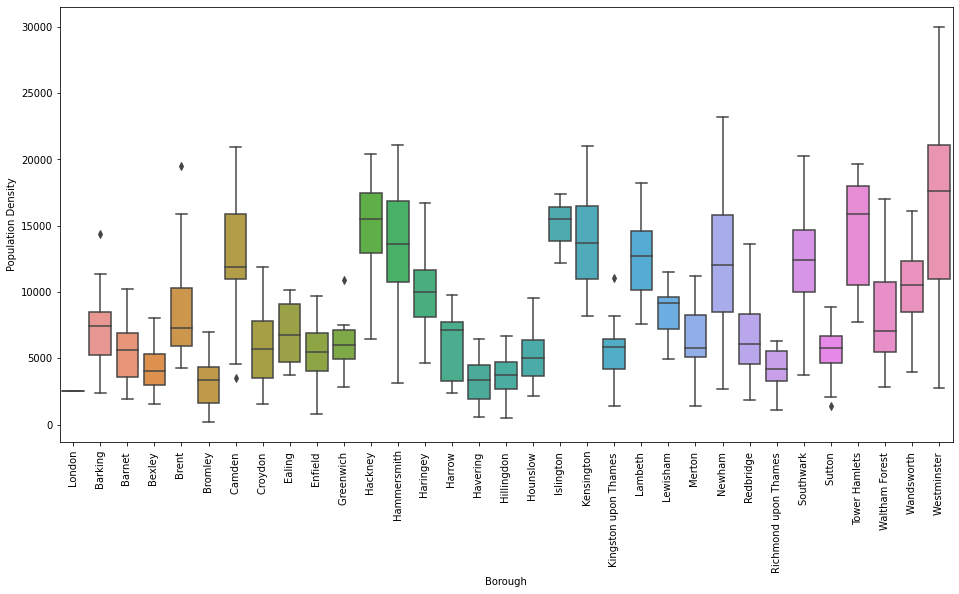

In [41]:
# Let's see the distribution of population density across all the boroughs. 
variable = 'Population Density'

plt.figure(figsize = [16,8])
sns.boxplot(x = 'Borough', y = variable, data = london_df)
plt.xticks(rotation=90)
plt.show()

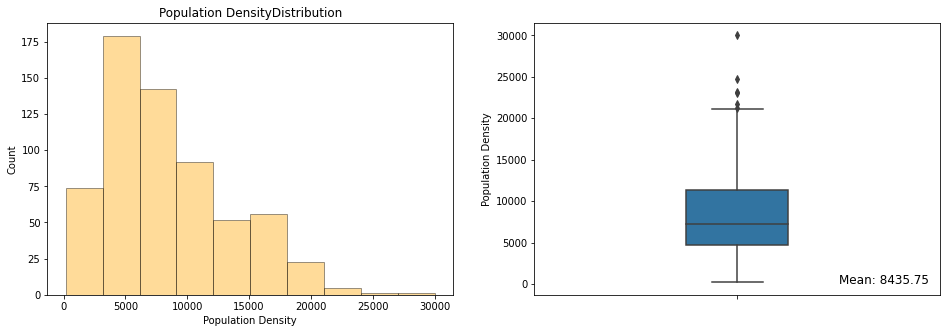

In [42]:
f, axes = plt.subplots(1, 2, figsize = [16,5])

a = london_df[variable]
hist, bin_edges = np.histogram(a, bins=10)

sns.distplot(a, bins=bin_edges, 
             kde = False, ax= axes[0], 
             color='Orange',
             hist_kws={'histtype': 'barstacked', 'edgecolor': 'black'})

axes[0].set_title(variable + 'Distribution')
axes[0].set_xlabel(variable)
axes[0].set_ylabel('Count')

sns.boxplot(y = variable, data = london_df, ax = axes[1], width=0.25)
axes[1].text(0.25, 0,'Mean: ' + str(round(london_df[variable].mean(),2)), fontsize=12)
plt.show()

Histogram for population density shows, just over 51% of the wards have population density between 3000 and 9000. Yet, there are quite a few local wards towards 9000+, and looking at the box plot for the whole Grater London area, it is clear that there are few outlier suburbs as well.

Box plot statistics are shown below in numerical format, which illustrates that the mean value for population density is around 8500 people/ward.

In [43]:
london_df[variable].describe()

count      625.000000
mean      8435.749510
std       5006.258731
min        182.758621
25%       4750.000000
50%       7203.125000
75%      11346.153846
max      30000.000000
Name: Population Density, dtype: float64

### 6.2 Medical Centre Count

Now, we will see the distribution of the medical centre counts within the boroughs and local wards. As shown below, we have collected total of 8131 records of medical centre through our Foursquare API call for 625 wards in Greater London area.

In [45]:
# Let's first see how many medical centre information that we fetched from Foursquare API.
print('Collected {} medical centres across Greater London Area.'.format(london_df['Medical Centre Count'].sum()))

Collected 8079 medical centres across Greater London Area.


There are some areas with high count of medical centres, but they don't have higher population density, and opposite is true for some localities too. 

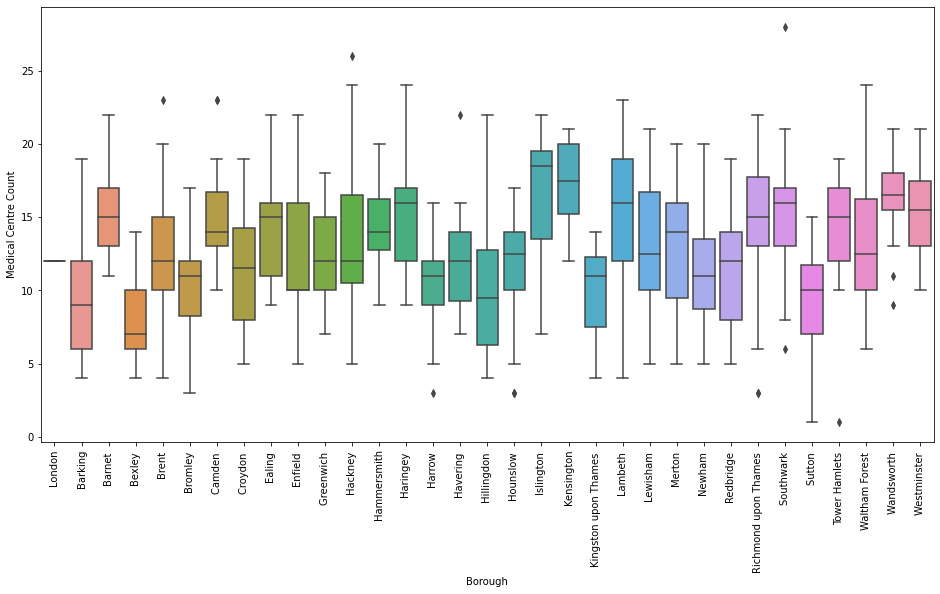

In [46]:
# Let's see the distribution of population density across all the boroughs. 
variable = 'Medical Centre Count'

plt.figure(figsize = [16,8])
sns.boxplot(x = 'Borough', y = variable, data = london_df)
plt.xticks(rotation=90)
plt.show()

As anticipated, in general, there is a slight correlation between population density and medical centre count. This is not the case with other features and medical centre count. See the below regression plots on this. 

We will see further on Growth coefficient, but, it is clear from the below regression plot that most of the growth factors are between 0 and 100 people/year. There is not much correlation with this feature and medical centre count. 

It is interesting to note that our hypothesis of having higher percentage of older population or kids in the local ward would be favourable for medical centre placement. Looking at the regression plots, this does not seem to be the case.

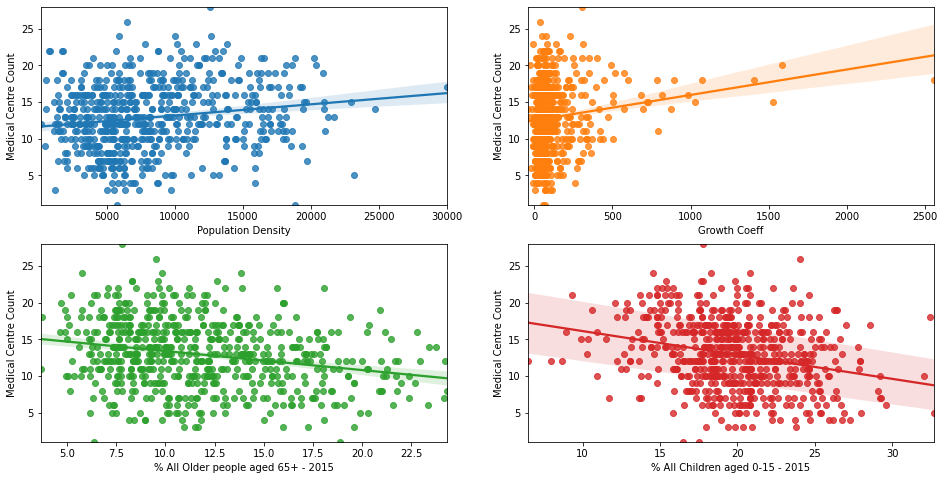

In [47]:
f, axes = plt.subplots(2, 2, figsize = [16, 8])

variables = ['Population Density','Growth Coeff', '% All Older people aged 65+ - 2015', 
              '% All Children aged 0-15 - 2015']

for i, variable in enumerate(variables):
    sns.regplot(x=variable, y='Medical Centre Count', data = london_df, ax = axes[int(i/2), i%2])
    axes[int(i/2), i%2].set_xlim(left = london_df[variable].min(), right = london_df[variable].max())
    axes[int(i/2), i%2].set_ylim(bottom = london_df['Medical Centre Count'].min(),
                                 top = london_df['Medical Centre Count'].max())
                                 

In [65]:
# Let's calculate the Pearson correlation coefficient and p-value for our population features and medical centre count.
variables = ['Population Density','Growth Coeff', '% All Older people aged 65+ - 2015', 
              '% All Children aged 0-15 - 2015']

correlation_coeff = []
p_values = []

for variable in variables:
    corr, pval = pearsonr(x = london_df['Medical Centre Count'], y = london_df[variable]) 
    correlation_coeff.append(corr)
    p_values.append(pval)

Corr_df = pd.DataFrame({'Pearson Correlation Coeff': correlation_coeff, 'p-Value': p_values})
Corr_df.index = variables
Corr_df

,Pearson Correlation Coeff,p-Value
Population Density,0.166682,2.813654e-05
Growth Coeff,0.149734,1.719184e-04
% All Older people aged 65+ - 2015,-0.240787,1.076964e-09
% All Children aged 0-15 - 2015,-0.267339,1.089597e-11


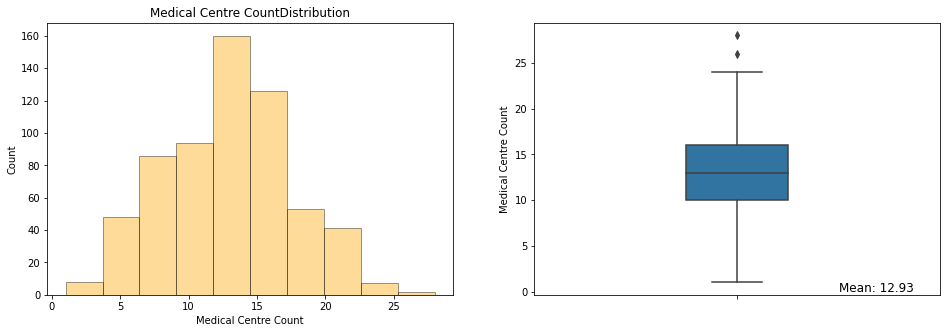

In [48]:
f, axes = plt.subplots(1, 2, figsize = [16,5])

variable = 'Medical Centre Count'
a = london_df[variable]
hist, bin_edges = np.histogram(a, bins=10)

sns.distplot(a, bins=bin_edges, 
             kde = False, ax= axes[0], 
             color='Orange',
             hist_kws={'histtype': 'barstacked', 'edgecolor': 'black'})

axes[0].set_title(variable + 'Distribution')
axes[0].set_xlabel(variable)
axes[0].set_ylabel('Count')

sns.boxplot(y = variable, data = london_df, ax = axes[1], width=0.25)
axes[1].text(0.25, 0,'Mean: ' + str(round(london_df[variable].mean(),2)), fontsize=12)
plt.show()

From the histogram, it is clear that medical centre count is generally hover between 10-20 for a local ward. Mean value is around 13 centres. There is only one ward with 28 medical centres within its neighbourhood. 

In [49]:
london_df[variable].describe()

count    625.000000
mean      12.926400
std        4.595255
min        1.000000
25%       10.000000
50%       13.000000
75%       16.000000
max       28.000000
Name: Medical Centre Count, dtype: float64

In [50]:
london_df[london_df['Medical Centre Count']>25]

,New code,Borough,Ward,Latitude,Longitude,Population - 2015,Area - Square Kilometres,Population Density,Growth Coeff,% All Children aged 0-15 - 2015,% All Older people aged 65+ - 2015,Medical Centre Count
216,E05000241,Hackney,King's Park,51.544970,-0.078465,11650,1.8,6472.222222,35.437242,24.052478,9.500943,26
515,E05000540,Southwark,East Walworth,51.490114,-0.090660,13850,1.1,12590.909091,302.730394,17.789017,7.774566,28


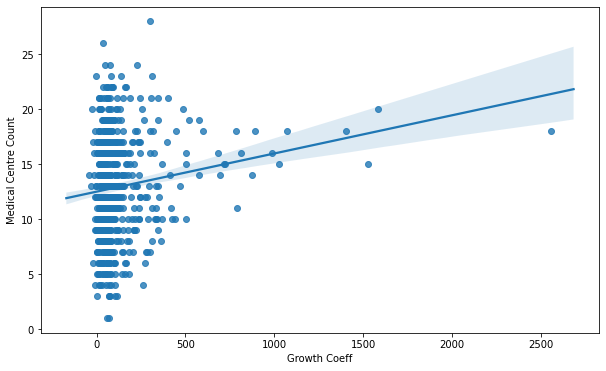

In [51]:
f, ax = plt.subplots(1,1, figsize= [10,6])
sns.regplot(x = london_df['Growth Coeff'], y = london_df['Medical Centre Count'], ax = ax)
plt.show()

### 6.3 Other Features

We will not go into much details on the other 3 features, namely, Growth Coefficient, % All Children aged 0-15, % All Older people aged 65+. Histogram plots clearly show the distribution of the values across all the neighbourhoods and box plot summarizes the statistics. 

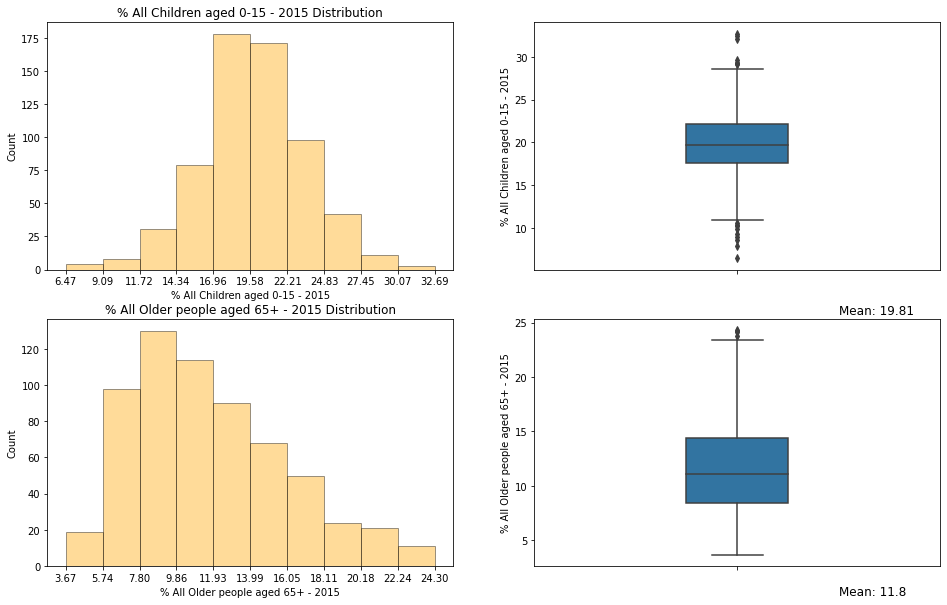

In [52]:

variables = ['% All Children aged 0-15 - 2015', '% All Older people aged 65+ - 2015']

f, axes = plt.subplots(2, 2, figsize = [16,10])

for i, variable in enumerate(variables):
    a = london_df[variable]
    hist, bin_edges = np.histogram(a, bins=10)

    sns.distplot(a, bins=bin_edges, 
                 kde = False, ax= axes[i,0], 
                 color='Orange',
                 hist_kws={'edgecolor': 'black'})
    
    axes[i,0].set_xticks(bin_edges)
    
    axes[i,0].set_title(variable + ' Distribution')
    axes[i,0].set_xlabel(variable)
    axes[i,0].set_ylabel('Count')

    sns.boxplot(y = variable, data = london_df, ax = axes[i,1], width=0.25)
    axes[i,1].text(0.25, 0,'Mean: ' + str(round(london_df[variable].mean(),2)), fontsize=12)

plt.show()

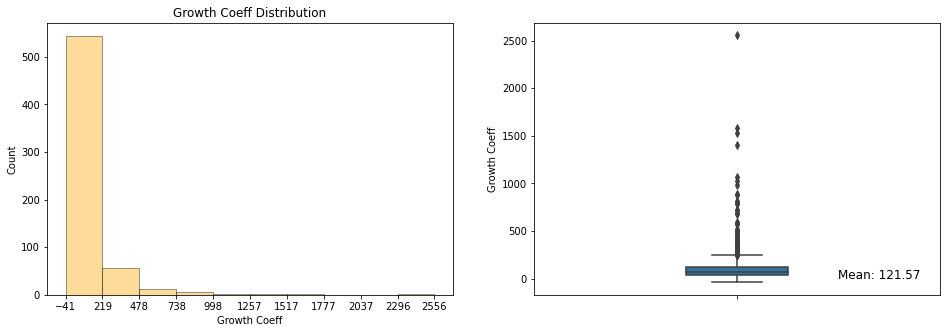

In [67]:
variable = 'Growth Coeff'
f, axes = plt.subplots(1, 2, figsize = [16,5])

a = london_df[variable]
hist, bin_edges = np.histogram(a, bins=10)

sns.distplot(a, bins=bin_edges, 
            kde = False, ax= axes[0], 
            color='Orange',
            hist_kws={'edgecolor': 'black'})
    
axes[0].set_xticks(bin_edges)
    
axes[0].set_title(variable + ' Distribution')
axes[0].set_xlabel(variable)
axes[0].set_ylabel('Count')

sns.boxplot(y = variable, data = london_df, ax = axes[1], width=0.25)
axes[1].text(0.25, 0,'Mean: ' + str(round(london_df[variable].mean(),2)), fontsize=12)

plt.show()

## 7. Clustering the Local Wards

Let's cluster the local wards based on following features. We don't include the feature Medical centre count for this clustering. We first look at the preferred suburbs based on the first 4 features. Then, we will look at the competition (existing medical centre count) for each cluster. 

* Population Density
* Growth Coeff
* % All Older people aged 65+ - 2015
* % All Children aged 0-15 - 2015

### 7.1 Feature Scaling 

First of all, we extract these features into seperate dataframe and then apply feature scaling, which is very important pre-processing step in the clustering approaches. 

In [68]:
feature_list = ['Population Density',
                'Growth Coeff', 
                '% All Older people aged 65+ - 2015',                 
                '% All Children aged 0-15 - 2015']     

features_df = london_df.loc[:,feature_list]

scalar = StandardScaler()
transformed_feature_df = scalar.fit_transform(features_df.values)

### 7.2 K-Means Clustering

We now use commonly used clustering approach, K-means clustering for segmenting our local wards. First, we use the graph of Sum of squared distances (SSD) of samples to their closest cluster center with cluster numbers to determine the optimal cluster count. 

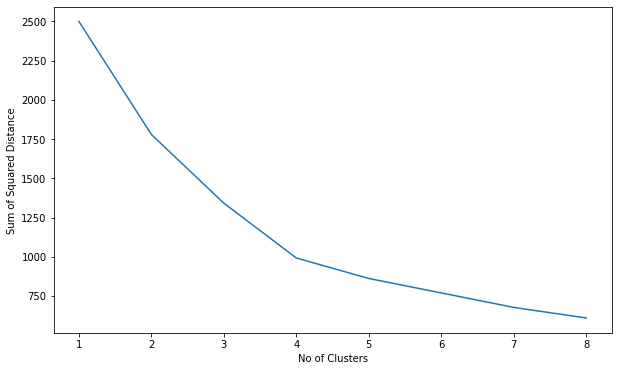

In [69]:
plt.figure(figsize=[10, 6]) 
ssd = []

for k in range(1, 9):
    clustering = KMeans(n_clusters=k, init = 'k-means++', random_state=0)
    clustering.fit(transformed_feature_df)
    ssd.append(clustering.inertia_)

plt.plot(list(range(1,9)), ssd)
plt.xlabel('No of Clusters')
plt.ylabel('Sum of Squared Distance')

plt.show()

In [70]:
# Looking at the graph above, it seems using 4 clusters would be the best option to have a reasonable separation and
# segmentation of the classes.
# Here, we cluster the dataset to 4 clusters and then add those cluster labels to our london_df dataframe. 

no_clusters = 4
clustering = KMeans(n_clusters = no_clusters, init = 'k-means++', random_state=0)
clustering.fit(transformed_feature_df)

if 'Label' in set(london_df.columns):
    london_df.drop(['Label'], axis=1, inplace=True)
    
london_df.insert(loc=0, column='Label', value=clustering.labels_)

In [71]:
# After adding the labels, we calculate mean value for features in the each cluster. This will give us a clear idea
# about each cluster. 

mean = []
count = []

for i in range(no_clusters):
    mean_values = london_df[london_df['Label'] == i].describe().loc['mean'].values[1:].tolist()
    mean_values.append(london_df[london_df['Label'] == i].shape[0])
    mean.append(mean_values)

headers = london_df[london_df['Label'] == 0].describe().loc['mean'].index[1:].tolist()

headers.append('Count')

summary_df = pd.DataFrame(data=mean, columns=headers)
summary_df = summary_df[['Population Density',
            'Growth Coeff', 
            '% All Older people aged 65+ - 2015', 
            '% All Children aged 0-15 - 2015',
            'Medical Centre Count',
            'Count']]

## 8. Discussion

# Check this section for numbers and colors
### 8.1 Cluster Analysis


Looking at the below table and bar graphs, we can extract following summary about our clusters.


<b>Cluster - 0: Low-Density & Low-Growth suburbs:</b>  
These is the second highest number of suburbs (206 wards) in Grater London area. Characteristics of these suburbs close to more of established neighbourhoods, where you have less population density, higher old (65+) age population and low growth factor. Even the young kid population is comparatively lower in these suburbs. 


<b>Cluster - 1: High-density suburbs:</b>  
  These are the local wards with high population density. Yellow verticals in population density box plot shows, significantly higher population density than the mean London population density for almost all of the suburbs in Cluster 1. 
  
  
<b>Cluster - 2: Average suburbs:</b>  
  Just over one-third of the wards (216) are assigned to this cluster. Looking at the statistics of this cluster, it appears to be the cluster that contain wards with average statistics. In each box plot, blue vertical is corresponding to cluster 0. Blue solid line across each graph shows the mean value across all the 625 wards for the respective feature. As can be seen, blue vertical bar for each feature is more or less at the mean level.     
     
     
<b>Cluster - 3: High-Growth/Booming suburbs:</b>  
 These local wards have very high population growth rate. Comparatively, they have lower older (65+) age population and lower population density, suggesting they could be new suburbs with young families (as they have higher percentage of young kids in the population as well. 
   


In [72]:
# Let's replace the Label field for clusters with meaningful name that we defined above. 

london_df['Label'].replace(to_replace = {0: 'Low Density\nLow Growth',
                                         1: 'High Density',
                                         2: 'Average', 
                                         3: 'High Growth'}, inplace = True)

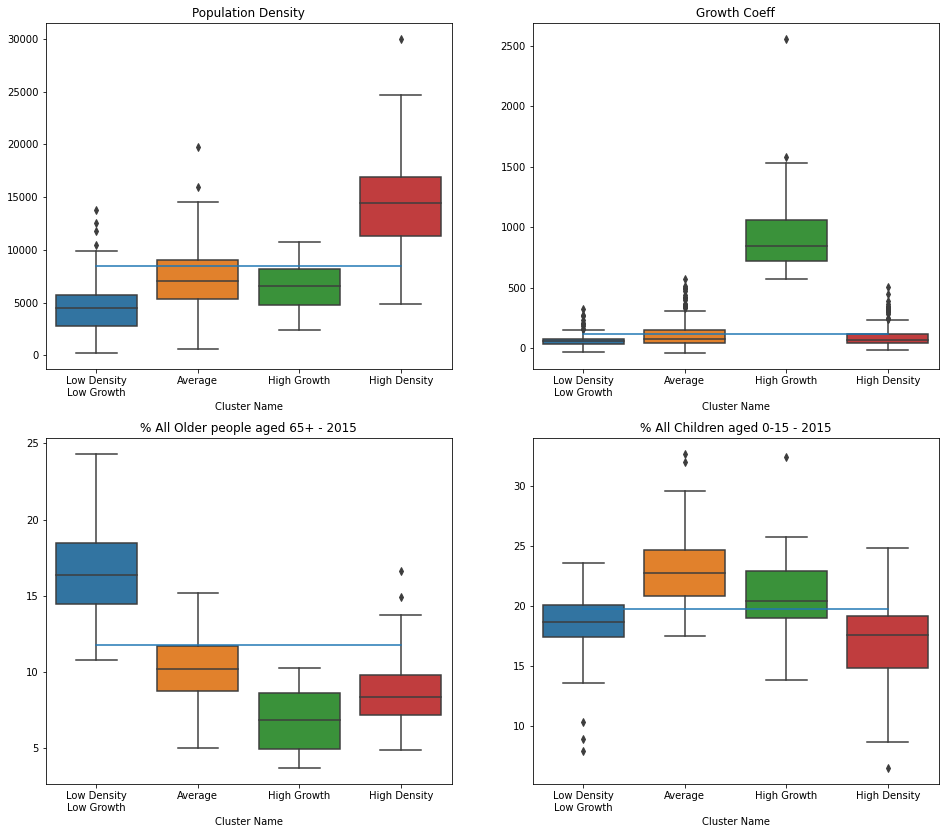

,Population Density,Growth Coeff,% All Older people aged 65+ - 2015,% All Children aged 0-15 - 2015,Medical Centre Count,Count
Low Density/Low Growth,4494.954294,64.854493,16.786284,18.613186,11.901961,204
High Density,14354.709188,99.592653,8.690110,17.038291,14.830601,183
Average,7316.774520,119.181886,10.149063,23.100405,12.013636,220
High Growth,6598.366225,1017.007281,6.913234,21.187281,16.333333,18


In [73]:
f, axes = plt.subplots(2, 2, figsize = [16, 14])                                    

for i in range(4):
    sns.boxplot(x=london_df['Label'], y=london_df[summary_df.columns[i]], ax=axes[int(i/2), i%2])      
    
    # Plot the mean value in the graph - Note: This is the mean value across all 624 local wards
    mean_array = np.ones(summary_df.index.shape[0])*london_df[summary_df.columns[i]].mean()
    sns.lineplot(summary_df.index, mean_array, ax = axes[int(i/2), i%2])
    
    axes[int(i/2), i%2].set_title(summary_df.columns[i])
    axes[int(i/2), i%2].set_xlabel('Cluster Name')
    axes[int(i/2), i%2].set_ylabel('')
plt.show()

# Let's print the summary table which show the same stats. 
cluster_names = ['Low Density/Low Growth', 'High Density', 'Average', 'High Growth']
#cluster_names = ['Cluster-0', 'Cluster-1', 'Cluster-2', 'Cluster-3']
summary_df.index = cluster_names

summary_df

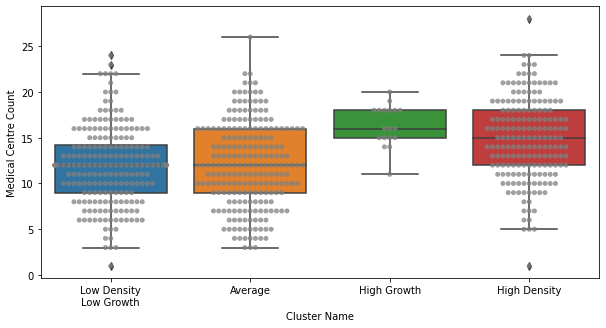

In [74]:
f, ax = plt.subplots(1, 1, figsize = [10, 5])
sns.boxplot(x = london_df['Label'], y = london_df['Medical Centre Count'],ax = ax)
sns.swarmplot(x = london_df['Label'], y = london_df['Medical Centre Count'], color = 'gray', alpha = 0.75, ax = ax)

#ax.text(0, 24, 'Low Density\nLow Growth', fontsize=14, color="black")

ax.set_xlabel('Cluster Name')

plt.show()

In the above plot, each grey dot is a local ward with respective medical centre count as shown in the vertical axis.

One interesting characteristic with the 'High Growth' wards is that they tend to have considerably higher medical centre count compared to other clusters. Looking at the numbers given in the table above, mean medical centre count for this class is 17, and minimum value is 12, this is comparatively higher numbers. 

For the purpose of our business idea, which is to pick few candidate wards for starting a new medical practice, it is probably worth consider location on following criteria. 

* Cluster 1, 2 and 3 wards are most suitable for the purpose. 
* Within those clusters, it is better to consider wards with low count of medical centres. Looking at the box plot, there appears to be quite a few suburbs fall into that category. 
* It is also possible to use statistical measures (say mean value) of other features to further filter out wards within those clusters. 

### 8.2 Visualization in Maps

We use Geopandas for creating a choropleth map of Greater London area with our clusters. Geopandas dataframes are somewhat similar to Pandas dataframes. Best of all, Geopandas allows to create standalone choropleth maps without many other dependencies.

For the shape files that Geopandas required for mapping is readily available in London Datastore. We found number of source files with significant level of details in following location, https://data.london.gov.uk/dataset/statistical-gis-boundary-files-london. 

One important point to note here (which was also mentioned at the start of this project). Our london_df has City of London as one local ward, but it is actually a borough. So, in our shape file, we have 25 wards those belongs to City of London borough, but we don't have individual details for all of these 25 wards in our london_df. Hence, what we do is, we use same figures in our london_df for City of London to all 25 wards in mapping geopanda dataframe. 

In [75]:
# Let's import data from london datastore to geopandas dataframe

london_map = 'statistical-gis-boundaries-london\\statistical-gis-boundaries-london\\ESRI\\London_Ward.shp'
map_df = gpd.read_file(london_map)

# We will now join the two dataframes (geo dataframe and london_df) together based on the ward code. We will use an left-outer 
# join between the two dataframes, so we get all records from map dataframe and then see any missing values. As mentioned above,
# merged dataframe should contain null values for features in london_df for 25 records (wards) in City of London Borough. 

merged_df = pd.merge(left = map_df, right=london_df, left_on='GSS_CODE', right_on='New code', how ='left')

In [76]:
# Let's see how many null values in our merged dataframe. This validates that there are 25 missing records. 

null_df = pd.isnull(merged_df)
null_df.sum(axis=0)

NAME                                   0
GSS_CODE                               0
HECTARES                               0
NONLD_AREA                             0
LB_GSS_CD                              0
BOROUGH                                0
POLY_ID                                0
geometry                               0
Label                                 25
New code                              25
Borough                               25
Ward                                  25
Latitude                              25
Longitude                             25
Population - 2015                     25
Area - Square Kilometres              25
Population Density                    25
Growth Coeff                          25
% All Children aged 0-15 - 2015       25
% All Older people aged 65+ - 2015    25
Medical Centre Count                  25
dtype: int64

In [77]:
# Now, we will set all these null values columns equal to respective values from the london_df (City of London, at index 0).
feature_list.append('Label')
feature_list.append('Medical Centre Count')

for feature in feature_list:
    merged_df.loc[null_df[feature], feature] = london_df.loc[0, feature]

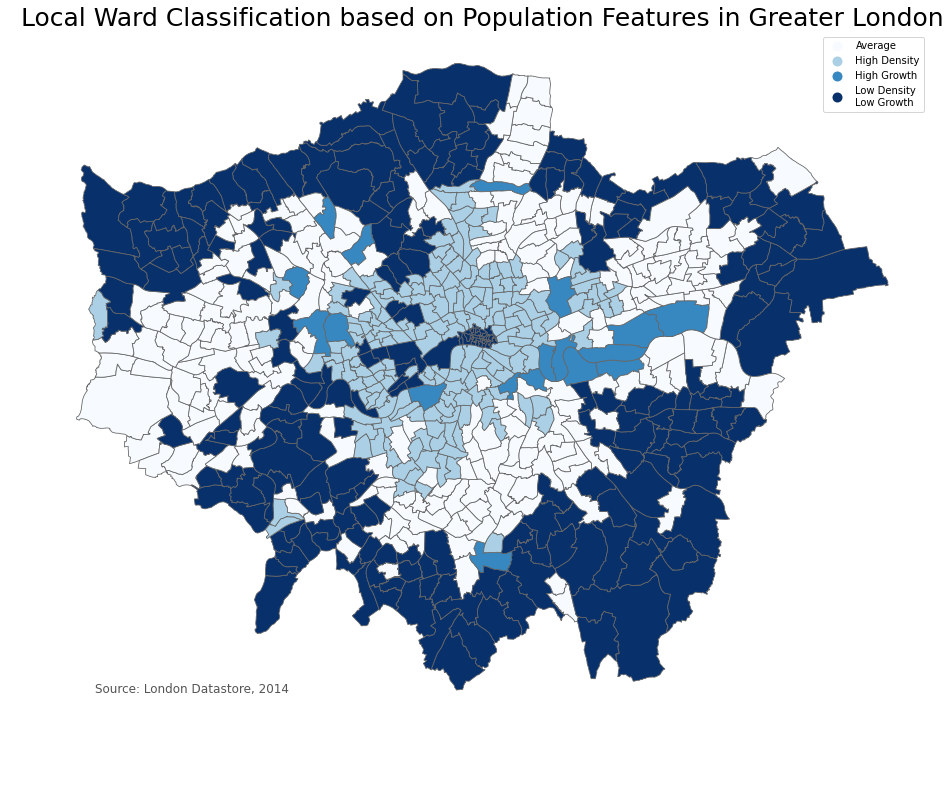

In [78]:
# Let's visualize cloropleth of Greater London with the labels.

fig, ax = plt.subplots(1, 1, figsize = [16, 16])
merged_df.plot(column = 'Label', cmap='Blues', linewidth=0.8, 
               edgecolor='0.4', ax = ax, legend=True, categorical = True)
ax.axis('off')

ax.set_title('Local Ward Classification based on Population Features in Greater London',
             fontdict={'fontsize': '25', 'fontweight' : '3'})

# create an annotation for the data source
ax.annotate('Source: London Datastore, 2014',xy=(0.1, .15), 
            xycoords='figure fraction', horizontalalignment='left', verticalalignment='top', fontsize=12, color='#555555')
            
plt.show()

## 9. Further Optimizations

### 9.1 Filtering Criteria

We can further filter out the wards and find best suited locations for our purpose. What we do here is, we look at Cluster 1 to 3 (average, high growth and high density) and then check for any wards that fall into criteria specified below. We would not consider Cluster 0, which is low density and low growth, because it probably doesn't worth the effot in establishing a medical centre in less demanding area. 


1. Feature values for given suburb greater than average feature value for the given cluster. Here, features are:
    
    a. Population Density
    
    b. % (0-15)-year olds in the population
    
    c. Population growth Coefficient
    
2. And, then, we look at medical centre count. We consider only the suburbs those having less than 25% percentile medical centre count for the given cluster. 


<b>NOTE</b>: We disregard 65+ old population from our filtering criteria, assuming that we are interested in a paediatric-related medical centre, in which case, it is more important to consider on the population density, growth rate and (0-15) year old percentages in the local ward.

In [79]:
cluster_names = ['High Density', 'Average', 'High Growth']

for i, cluster in enumerate(cluster_names):
    filter_df  = london_df[london_df['Label'] == cluster]
    
    extracted_df = filter_df[(filter_df['Population Density'] > summary_df.loc[cluster, 'Population Density']) & 
           (filter_df['% All Children aged 0-15 - 2015'] > summary_df.loc[cluster, '% All Children aged 0-15 - 2015']) &  
           (filter_df['Growth Coeff'] > summary_df.loc[cluster, 'Growth Coeff']) & 
           (filter_df['Medical Centre Count'] < london_df[london_df['Label'] == cluster].describe().loc['25%', 'Medical Centre Count'])]
    
    if (i == 0):
        return_df = extracted_df
    else:
        return_df = pd.concat([return_df, extracted_df], axis = 0)
        
return_df = return_df.reset_index(drop=True)

return_df

,Label,New code,Borough,Ward,Latitude,Longitude,Population - 2015,Area - Square Kilometres,Population Density,Growth Coeff,% All Children aged 0-15 - 2015,% All Older people aged 65+ - 2015,Medical Centre Count
0,High Density,E05000480,Newham,East Ham Central,51.539400,0.052604,16200,1.0,16200.000000,171.955910,22.422633,7.529804,8
1,High Density,E05000550,Southwark,South Bermondsey,51.487951,-0.054456,14400,1.0,14400.000000,162.376548,19.765506,7.374775,6
2,High Density,E05000578,Tower Hamlets,Bromley,51.526631,-0.017232,19750,1.1,17954.545455,338.839681,24.632465,4.957924,10
3,Average,E05000246,Hackney,Springfield,51.568399,-0.056567,12800,1.0,12800.000000,181.457411,32.694714,7.475759,5
4,Average,E05000498,Redbridge,Chadwell,51.570047,0.129784,14850,1.5,9900.000000,142.317167,25.414253,10.076788,5
5,Average,E05000507,Redbridge,Loxford,51.548194,0.084051,17700,1.3,13615.384615,283.987711,29.192547,6.871824,7
6,Average,E05000510,Redbridge,Newbury,51.575499,0.089969,17450,2.1,8309.523810,310.135929,24.808067,9.808640,8
7,Average,E05000512,Redbridge,Seven Kings,51.563906,0.096881,16950,2.1,8071.428571,280.408912,24.877588,8.996519,7


### 9.2 Visualization on Choropleth Map

There are interesting approaches for generating choropleth map. In the previous section we used Geopandas for directly creating a thermatic plot with labels for Greater London area. However, that map is not interactive at all. 


In this section, we will use Folium with Geopandas (for importing shape file). This will produce a similar thematic map, but we also add our filtered local wards (extracted above, 10 suburbs) and we show the individual medical centres on the map itself for those interested neighbourhoods. 


<b>NOTE:</b> We use a new label category called <i>Desired Location</i> to show the filtered local neighbourhood, which matches our criteria. Further to that, as mentioned above, individual medical centre locations are illuestrated on the map with pins (only for those 10 interested local wards), so that we can find optimal locations for placement of the new medical centre.

In [80]:
# After getting those filtered dataframe of wards those are fitting to our criteria, we will merge them with our
# Geopandas dataframe for a Choropleth visualization. 

filtered_ward_codes = set(return_df['New code'].values)

for i in range(merged_df.shape[0]):
    if (merged_df.loc[i, 'GSS_CODE'] in filtered_ward_codes):
        merged_df.loc[i, 'Label'] = 'Desired Location'
    else:
        merged_df.loc[i, 'Label'] = 'Not Location'

# We will create a categorical vairable type for Label field, otherwise label encoder in Pandas won't be able to 
# provide a numerical encode value for this. This numerical label assignment is important in here, otherwise, choropleth 
# was unable to use textual lables in the map. 
# There needs to be further investigation on this of how to show the categorical data, instad of a color bar.

merged_df["Label"] = merged_df["Label"].astype('category')
merged_df["Cluster ID"] = merged_df["Label"].cat.codes

In [81]:
# We will now extract medical centre details to all of those 10 local wards in the return_df. We will use
# Foursquare API again and fetch the information. 

count = 0

# Let's define 5 lists for saving our data for each medical centre
mc_names = []
mc_lat = []
mc_lng = []
mc_category = []

for index in range(return_df.shape[0]):
    lat = return_df.loc[index, 'Latitude']
    lng = return_df.loc[index, 'Longitude']
    
    # Instead of a fixed radius, we use a variable size radius based on the ward size. 
    radius = np.sqrt(return_df.loc[index, 'Area - Square Kilometres'])*1000   
    
    
    url = 'https://api.foursquare.com/v2/venues/search?ll={},{}&radius={}&limit=75&categoryId=4bf58dd8d48988d104941735&client_secret={}&client_id={}&v={}'.format(
    lat, lng, radius, CLIENT_SECRET,CLIENT_ID, VERSION)
    results = requests.get(url).json()    
    
    try:
        for place in results['response']['venues']:
            category_type = place['categories'][0]['pluralName']

            if (category_type=='Medical Centers') | (category_type=="Doctor's Offices"):
                mc_names.append(place['name'])
                mc_lat.append(place['location']['lat'])
                mc_lng.append(place['location']['lng'])
                mc_category.append(category_type)
                count += 1
    except:
        print('Couldnt find')
        
print('Found {} medical centres in the interested local wards.'.format(count))

Found 56 medical centres in the interested local wards.


In [82]:
# Let's create a dataframe with these medical centre details

medical_centre_df = pd.DataFrame({'Name': mc_names,
                                  'Latitude': mc_lat,
                                  'Longitude': mc_lng,
                                  'Category': mc_category})
medical_centre_df

,Name,Latitude,Longitude,Category
0,Shrewsbury Road Health Centre,51.539183,0.044021,Doctor's Offices
1,Diabetic Retinal Screening Service,51.547786,0.053815,Medical Centers
2,Manor Park Health Centre,51.547854,0.053403,Doctor's Offices
3,Church Road Medical Center,51.547860,0.053901,Doctor's Offices
4,Market street health group,51.530942,0.056886,Doctor's Offices
5,St Stephen’s Midwifery Group Practice,51.538081,0.038425,Medical Centers
6,Newham Ambulance Station,51.531535,0.057812,Medical Centers
7,St. Bartholomew's Surgery,51.532417,0.050393,Medical Centers
8,Silverlock Medical Centre,51.490536,-0.049492,Doctor's Offices
9,Park Medical Centre,51.492438,-0.049625,Doctor's Offices


In [83]:

mymap = folium.Map(location = [51.507184, -0.127761], zoom_start=10, tiles='OpenStreetMap',)

choropleth = folium.Choropleth(
 geo_data=merged_df,
 name='Choropleth',
 data=merged_df,
 bins = 3,
 columns=['GSS_CODE','Cluster ID'],
 key_on="feature.properties.GSS_CODE",
 fill_color= 'Blues',
 fill_opacity=0.4,
 line_opacity=0.4,
 smooth_factor=0,highlight=True,
).add_to(mymap)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['GSS_CODE'])
)
# Let's add markers to each medical centre location using a marker cluster.

# instantiate a mark cluster object for the incidents in the dataframe
mc_markers = plugins.MarkerCluster().add_to(mymap)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(medical_centre_df.Latitude, medical_centre_df.Longitude, medical_centre_df.Category):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(mc_markers)

# display map
mymap

## 10. Conclusion

In this study, we looked at 625 local wards in Greater London area to figure out suitable neighbourhoods for positioning a new medical centre. 

We primarily used datasets available in London Datastore and Foursquare API to get ward profile data for each local ward and existing medical centre details. After looking at descriptive statistics for each population related features, we segmented 625 wards into 4 different clusters using K-means clustering algorithm. 

Looking at the feature distribution, we identified that our machine learning algorithm has created clusters, which demonstrate characteristics similar to high density, high growth, low density/growth and average suburb profiles. We then investigated medical centre distribution on each cluster and then defined a further optimization approach to pick handful of local wards that fits into our business proposal. Based on that, we have identified 10 wards in Greater London area. 

We used Folium and Geopandas libraries in Python to generate choropleth maps and then used markers to show the medical centres on the map. 